# Проект: Исследование рынка заведений общественного питания Москвы 

**Требуется подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.**

# План работы:

1. Подготовка к работе
    1. Выведем таблицы и изучим данные
2. Предобработка данных
    1. Проверка на дубликаты
    2. Проверка на пропуски
    3. Создание столбца street с названием улиц
    4. Сздание столбца is24_7 с обозначением, что заведение работает 24 на 7
3.	Анализ данных
    1. Исследуем виды объектов общественного питания.
    2. Исследуем количество посадочных мест по категориям.
    3. Исследуем соотношение сетевых и не сетевых заведений.
    4. Расмотрим соотношение сетевых и несетевых магазинов по категориям.
    5. Сгруппируем данные по названиям заведений и найдем топ-15.
    6. Проверим в каких административных районах Москвы присутствуют заведения.
    7. Распределим средний рейтинг по категориям и визуализируем.
    8. Построим фоновую картограмму (хороплет).
    9. Отобразим все заведения на карте при помощи кластеров.
    10. Найдем Топ-15 улиц по каличеству заведений.
    11. Посчитаем медиану чека по каждому району.
    12. Общий вывод исследования.
4.  Детализация иследонваия: открытие кофейни
    1. Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
    2. Есть ли круглосуточные кофейни? 
    3. Какие у кофеен рейтинги? Как они распределяются по районам?
    4. На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
    5. Сколько сетей в категории кофейни?
    6. Рекомедации.
5. Презентация
    

## Подгатовка к работе

### Выведем таблицы и изучим данные

In [1]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
# снимем ограничение на ширину столбцов
pd.set_option('display.max_colwidth', None)
# снимаем ограничение на количество столбцов
pd.set_option('display.max_columns', None)

In [3]:
data = pd.read_csv('/datasets/moscow_places.csv')

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


**В данных представлено информация о 8406-ти разнообразных, от самых малых до огромных сетевых, точках общественного питания в Москве.**

## Предобработка данных

### Проверка на дубликаты

In [6]:
data.duplicated().sum()

0

**Проверим на не явные дубликаты**

Столбец котегорий общепитов

In [7]:
data.category.unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Дубликатов не выявлено

Столбец районов

In [8]:
data.district.unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Дубликатов не выявлено

Остальные столбцы нету смысла проверять, там может быть очень много разных значений

### Проверка на пропуски

In [9]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

**В первую очередь проверим столбец с информацией о днях и часах работы**

In [10]:
data.query('hours.isna()').head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
38,Ижора,булочная,"Москва, Ижорский проезд, 5А",Северный административный округ,NaN,55.888366,37.514856,4.4,NaN,NaN,NaN,NaN,0,NaN
40,Кафе,кафе,"Москва, Ижорская улица, 18, стр. 1",Северный административный округ,NaN,55.895115,37.524902,3.7,NaN,NaN,NaN,NaN,0,NaN
44,Кафетерий,кафе,"Москва, Ангарская улица, 24А",Северный административный округ,NaN,55.876289,37.519315,3.8,NaN,NaN,NaN,NaN,1,8.0
56,Рыба из тандыра,быстрое питание,"Москва, Коровинское шоссе, 46, стр. 5",Северный административный округ,NaN,55.888010,37.515960,1.5,NaN,NaN,NaN,NaN,0,NaN
108,Кафе,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,NaN,55.908930,37.558777,4.2,NaN,NaN,NaN,NaN,0,NaN


**Столбец с категорией цен**

In [11]:
data.query('price.isna()').head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
11,Шашлык Шефф,кафе,"Москва, улица Маршала Федоренко, 10с1",Северный административный округ,"ежедневно, 10:00–21:00",55.881770,37.492362,4.9,NaN,NaN,NaN,NaN,0,NaN
13,Буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0
19,Пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN


Столбец хронящий среднюю стоймость заказа

In [12]:
data.query('avg_bill.isna()').head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
11,Шашлык Шефф,кафе,"Москва, улица Маршала Федоренко, 10с1",Северный административный округ,"ежедневно, 10:00–21:00",55.881770,37.492362,4.9,NaN,NaN,NaN,NaN,0,NaN
13,Буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0
19,Пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN


Столбец с оценкой среднего чека

In [13]:
data.query('middle_avg_bill.isna()').head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
10,Great Room Bar,"бар,паб","Москва, Левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.877832,37.469171,4.5,средние,Цена бокала пива:250–350 ₽,NaN,NaN,0,102.0
11,Шашлык Шефф,кафе,"Москва, улица Маршала Федоренко, 10с1",Северный административный округ,"ежедневно, 10:00–21:00",55.881770,37.492362,4.9,NaN,NaN,NaN,NaN,0,NaN


Столбец с оценкой средней цены за чашку капучино

In [14]:
data.query('middle_coffee_cup.isna()').head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN


Столбец с количеством посадочных месть

In [15]:
seats = data.query('seats.isna()')
seats.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
11,Шашлык Шефф,кафе,"Москва, улица Маршала Федоренко, 10с1",Северный административный округ,"ежедневно, 10:00–21:00",55.881770,37.492362,4.9,NaN,NaN,NaN,NaN,0,NaN
12,Заправка,кафе,"Москва, МКАД, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,NaN,0,NaN


**Вывод:** В данных есть пропуски, но они скорее всего были не заполнена из-за недостатков данных о заведениях. Заполнить или удалить из таблицы не составляет возможным, т.к. при удаление будет искажено само исследование.

Столбцы middle_avg_bill и middle_coffee_cup, они на прямую зависят от столбца avg_bill, и могут быть заполнен либо один, либо другой.


### Создание столбца street с названием улиц

Выведем улицу в отдельную колонку. К сожалению, часть названий улиц будет обработано некорректно из-за различий в написании адреса.

In [16]:
data['street']=data['address'].apply(lambda x:x.split(',')[1])

In [17]:
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


### Сздание столбца is24_7  с обозначением, что заведение работает 24 на 7

Логическое значение True — если заведение работает ежедневно и круглосуточно;

Логическое значение False — в противоположном случае.

In [18]:
data['is24_7'] = data['hours'].str.contains('ежедневно, круглосуточно')

In [19]:
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is24_7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


## Анализ данных

### Исследуем виды объектов общественного питания

In [20]:
data_category = (data
                .groupby('category')
                .agg(count=('name','count'))
                .reset_index()
                .sort_values('count', ascending=False)
                )
data_category['percent'] = (data_category['count'] / sum(data_category['count']) * 100).round(2)


In [21]:
data_category

,category,count,percent
3,кафе,2378,28.29
6,ресторан,2043,24.30
4,кофейня,1413,16.81
0,"бар,паб",765,9.10
5,пиццерия,633,7.53
2,быстрое питание,603,7.17
7,столовая,315,3.75
1,булочная,256,3.05


In [22]:
fig= px.bar(data_category, x='category', y='count', title='Соотношение объектов по категориям')
fig.update_xaxes(tickangle=45)
fig.update_xaxes(title_text='Категория')
fig.update_yaxes(title_text='Кол-во объектов')
fig.show() 

**Вывод:** В лидерах категории кафе (28%) и рестораны (24%), на третьем месте кофейни (16,8%). Меньше всего в городе представлены булочные (3%).

### Исследуем количество посадочных мест по категориям 

In [23]:
data_category = (data
                .groupby('category')
                .agg(mean=('seats', 'mean'), count=('seats', 'count'))
                .reset_index()
                .sort_values('mean', ascending=False)
                )
data_category['mean']=data_category['mean'].round(0)

In [24]:
data_category

,category,mean,count
0,"бар,паб",125.0,468
6,ресторан,122.0,1270
4,кофейня,111.0,751
7,столовая,100.0,164
2,быстрое питание,99.0,349
3,кафе,98.0,1218
5,пиццерия,94.0,427
1,булочная,89.0,148


In [25]:
#Заведения с самыми большими залами
data.seats.max()

1288.0

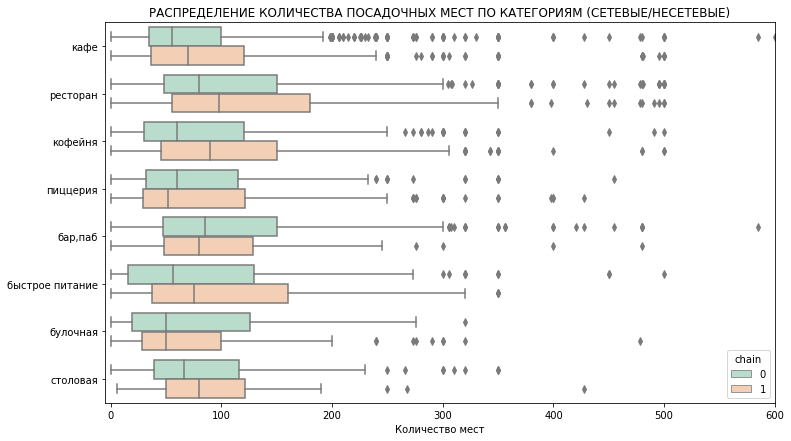

In [26]:
plt.figure(figsize=(12, 7))
sns.boxplot(x='seats', y='category', data=data, hue='chain', palette='Pastel2')
plt.xlim(-5,600)
plt.title('РАСПРЕДЕЛЕНИЕ КОЛИЧЕСТВА ПОСАДОЧНЫХ МЕСТ ПО КАТЕГОРИЯМ (СЕТЕВЫЕ/НЕСЕТЕВЫЕ)')
plt.xlabel('Количество мест')
plt.ylabel('')
plt.show()

**Вывод:** Как мы видим, самое большое количество посадочных мест - у бар/паб и ресторанов. В сетевых магазинах как правило в среднем больше посадочных мест в заведении чем несетевых.

### Исследуем соотношение сетевых и не сетевых заведений

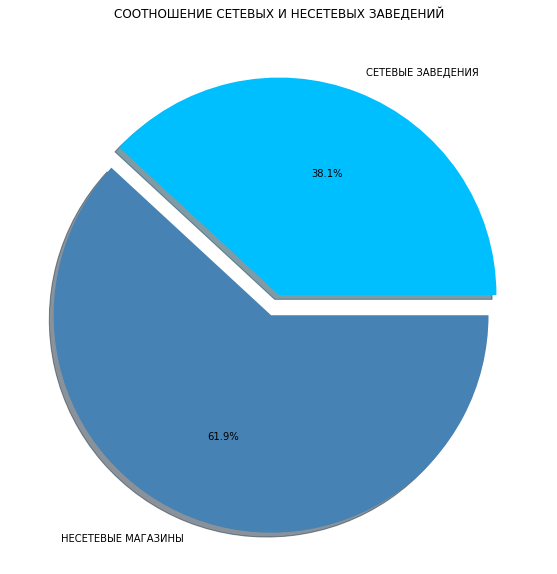

In [27]:
data_chain = data.groupby('chain').agg(count=('name','count')).reset_index()
plt.figure(figsize=(10, 10))
plt.pie(data_chain['count'],
        labels=data_chain['chain'].map({True: 'СЕТЕВЫЕ ЗАВЕДЕНИЯ', False: 'НЕСЕТЕВЫЕ МАГАЗИНЫ'}), 
        counterclock=False,
        colors = ['#4682B4', '#00BFFF'],
        explode = (0.1, 0),
        autopct='%1.1f%%',
        shadow=True)
plt.title('СООТНОШЕНИЕ СЕТЕВЫХ И НЕСЕТЕВЫХ ЗАВЕДЕНИЙ')
plt.show()

**Вывод:** Более 61% заведений несетевые. 

### Расмотрим соотношение сетевых и несетевых магазинов по категориям

In [28]:
data_chain_category  = data.pivot_table(
    index = 'category',
    columns = 'chain',
    values = 'name',
    aggfunc='count'
).rename(columns={True: 'network', False: 'not_network'}).sort_values(by='network', ascending=True).reset_index()
data_chain_category['percent'] = (data_chain_category['network']
                                  /(data_chain_category['network']
                                  +data_chain_category['not_network'])*100).round(1)
data_chain_category = data_chain_category.sort_values(by='percent', ascending=False)
data_chain_category

chain,category,not_network,network,percent
1,булочная,99,157,61.3
4,пиццерия,303,330,52.1
5,кофейня,693,720,51.0
3,быстрое питание,371,232,38.5
6,ресторан,1313,730,35.7
7,кафе,1599,779,32.8
0,столовая,227,88,27.9
2,"бар,паб",596,169,22.1


In [29]:
fig= px.bar(data_chain_category, x='category', y='percent', title='% сетевых от общего количества каждого типа')
fig.update_xaxes(tickangle=45)
fig.update_xaxes(title_text='Категория')
fig.update_yaxes(title_text='Доля')
fig.show() 

In [30]:
#data_chain_category[['not_network', 'network']].plot(kind='barh', stacked=True, figsize=(18, 6))
#plt.legend(['Сетевые', 'Не сетевые'])
#plt.xlabel('Количество заведений')
#plt.ylabel('')
#plt.show()

**Вывод:** Фактически во всех категория преобладают несетевые заведения и только три категории отличаются. В категории булочная, пиццерия и кофейни преобладают сети.

### Сгруппируем данные по названиям заведений и найдем топ-15

In [31]:
group_name = (data.query('chain == 1').groupby('name')
              .agg(count=('name','count')).sort_values(by='count', ascending=False).reset_index()
             )

In [32]:
group_name = group_name.head(15)
group_name

,name,count
0,Шоколадница,120
1,Домино'с Пицца,76
2,Додо Пицца,74
3,One Price Coffee,71
4,Яндекс Лавка,69
5,Cofix,65
6,Prime,50
7,Хинкальная,44
8,КОФЕПОРТ,42
9,Кулинарная лавка братьев Караваевых,39


In [33]:
fig=px.bar(group_name, x='count', y='name', title='Топ-15 сетевых заведений в Москве')
fig.update_xaxes(tickangle=45)
fig.update_xaxes(title_text='Кол-во заведений')
fig.update_yaxes(title_text='')
fig.show() 

С большим отрывом лидирует сеть кофейни «Шоколадница». Замыкает Топ-15 заведение «Му-Му». В лидерах сети очень знаменитые и везде на слуху.

In [34]:
list_group_name = group_name['name'].tolist()
top_15_category = (data.query('name in @list_group_name')
                   .groupby('name').agg(category=('category','max')).reset_index())
top_15_category

,name,category
0,CofeFest,кофейня
1,Cofix,кофейня
2,One Price Coffee,кофейня
3,Prime,ресторан
4,Буханка,кофейня
5,Додо Пицца,пиццерия
6,Домино'с Пицца,пиццерия
7,КОФЕПОРТ,кофейня
8,Кулинарная лавка братьев Караваевых,кафе
9,Му-Му,столовая


In [35]:
(top_15_category.groupby('category')
 .agg(count=('category','count')).sort_values(by='count', ascending=False).reset_index())

,category,count
0,кофейня,6
1,ресторан,4
2,пиццерия,2
3,столовая,2
4,кафе,1


In [36]:
fig=px.bar((top_15_category.groupby('category')
            .agg(count=('category','count'))
            .sort_values(by='count', ascending=False).
            reset_index()), 
           x='category', y='count', title='Категории к кторым относятся Топ-15 сетей')
fig.update_xaxes(title_text='Категория')
fig.update_yaxes(title_text='Кол-во заведений')
fig.show() 

**Вывод:** Самая популярная сеть, - это кофейня «Шоколадница». Все сети Топ-15 очень знаменитые и везде на слуху. В основном крупные сети относятся к категориям: Кофейня, Ресторан и пиццерия.

### Проверим в каких административных районах Москвы присутствуют заведения 

In [37]:
data.district.unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [38]:
data_district = (data.groupby('district')
                .agg(count=('name','count'))
                .sort_values(by='count', ascending=False).
                reset_index())

In [39]:
data_district

,district,count
0,Центральный административный округ,2242
1,Северный административный округ,900
2,Южный административный округ,892
3,Северо-Восточный административный округ,891
4,Западный административный округ,851
5,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Северо-Западный административный округ,409


In [40]:
fig=px.bar(data_district, x='district', y='count', title='Административные районы Москвы')
fig.update_xaxes(title_text='')
fig.update_yaxes(title_text='Кол-во заведений')
fig.show() 

На графике видим, что в центральном районе Москвы расположилось очень много заведений

In [41]:
data_district_category = (data.groupby(['district', 'category'])
                .agg(count=('name','count'))
                .sort_values(by='count', ascending=False).
                reset_index())

In [42]:
data_dis_cat = (data_district_category.groupby(['district'])
                .agg(sum=('count','sum'))
                .sort_values(by='sum', ascending=False).
                reset_index())
data_dis_cat

,district,sum
0,Центральный административный округ,2242
1,Северный административный округ,900
2,Южный административный округ,892
3,Северо-Восточный административный округ,891
4,Западный административный округ,851
5,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Северо-Западный административный округ,409


In [43]:
data_district_category = data_district_category.merge(data_dis_cat, how="left")
data_district_category['percent'] =  (data_district_category['count']/data_district_category['sum']*100).round(2)
data_district_category

,district,category,count,sum,percent
0,Центральный административный округ,ресторан,670,2242,29.88
1,Центральный административный округ,кафе,464,2242,20.70
2,Центральный административный округ,кофейня,428,2242,19.09
3,Центральный административный округ,"бар,паб",364,2242,16.24
4,Юго-Восточный административный округ,кафе,282,714,39.50
...,...,...,...,...,...
67,Северо-Западный административный округ,"бар,паб",23,409,5.62
68,Северо-Западный административный округ,столовая,18,409,4.40
69,Юго-Западный административный округ,столовая,17,709,2.40
70,Юго-Восточный административный округ,булочная,13,714,1.82


In [44]:
fig = px.bar(data_district_category, x='percent', y='district'
             , color='category', text='percent', title='Распредиление заведений в разрезе категорий по округам')
fig.update_xaxes(title_text='%')
fig.update_yaxes(title_text='')
fig.show()

**Вывод:** В центральном округе преобладают Рестораны, кафе и кофейни. Основное количество заведений расположена в ЦАО. Меньше всего общепита в СЗАО.

### Распределим средний рейтинг по категориям и визуализируем

In [45]:
data_rating = data.groupby('category').agg(rating=('rating', 'mean')).sort_values(by='rating', ascending=False).reset_index()
data_rating


,category,rating
0,"бар,паб",4.387712
1,пиццерия,4.301264
2,ресторан,4.290357
3,кофейня,4.277282
4,булочная,4.268359
5,столовая,4.211429
6,кафе,4.123886
7,быстрое питание,4.050249


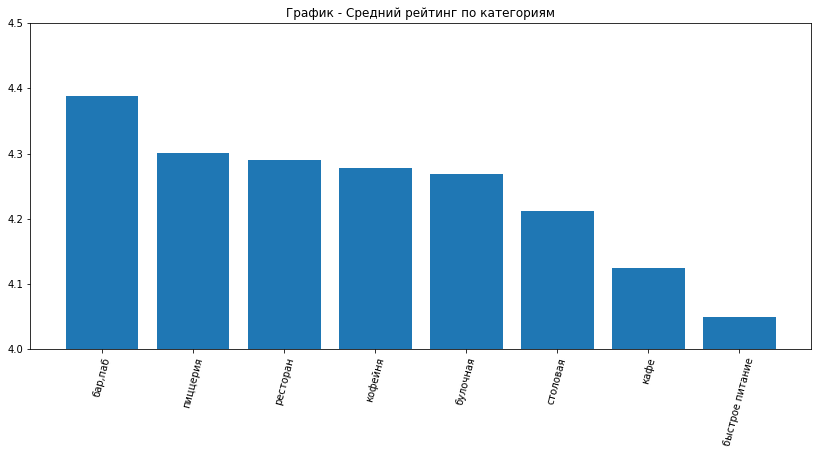

In [46]:
plt.figure(figsize=(14,6))
plt.bar(x = data_rating.category, height = data_rating.rating)
plt.ylim([4, 4.5])
plt.xticks(rotation = 75)
plt.title('График - Средний рейтинг по категориям')
plt.show()

**Вывод:** Самый высокий рейтинг у баров и пабов, видимо потому что в этих заведениях по минимуму берут еду, а в основном алкоголь и снеки. Самый низкий рейтинг у быстрого питания. 

### Построим фоновую картограмму (хороплет)

In [47]:
rating_data =  data.groupby('district', as_index=False)['rating'].agg('mean')
rating_data

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239778
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [48]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Вывод:** Наглядно видно, что самые высокие рейтинги в ЦАО

### Отобразим все заведения на карте при помощи кластеров

In [49]:
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m


**Вывод:** Кластеры облегчают работу карты, более 8000 заведений поместили на карту и она стабильно работает

### Найдем Топ-15 улиц по каличеству заведений

In [50]:
data_str = (data.groupby('street')
            .agg(sum=('name', 'count')).sort_values(by='sum', ascending=False).reset_index())
data_str = data_str.head(15)
data_str

,street,sum
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [51]:
fig = px.bar(data_str, x='street', y='sum', title='Топ-15 улиц')
fig.update_xaxes(title_text='')
fig.update_yaxes(title_text='Кол-во заведений')
fig.show()

In [52]:
data_street = (data.pivot_table(index ='street', columns = 'category', values = 'name', aggfunc = 'count')
 .sort_values(ascending=False, by = 'street'))
data_street = data_street.query('street in @data_str["street"]')

In [53]:
data_street = (data.groupby(['street', 'category'])
               .agg(count=('name', 'count'))
               .sort_values(by='count', ascending=False)
               .reset_index())
data_street = data_street.merge(data_str, how="left")
data_street['percent'] =  (data_street['count']/data_street['sum']*100).round(2)
data_street = data_street.query('street in @data_str["street"]')
data_street

,street,category,count,sum,percent
0,проспект Мира,кафе,53,184.0,28.80
1,проспект Мира,ресторан,45,184.0,24.46
2,МКАД,кафе,45,65.0,69.23
3,проспект Мира,кофейня,36,184.0,19.57
4,Профсоюзная улица,кафе,35,122.0,28.69
...,...,...,...,...,...
2086,проспект Вернадского,булочная,1,108.0,0.93
3472,Люблинская улица,пиццерия,1,60.0,1.67
3480,МКАД,"бар,паб",1,65.0,1.54
3504,МКАД,столовая,1,65.0,1.54


In [54]:
fig = px.bar(data_street, x='percent', y='street'
             , color='category', text='percent', title='Распредиление заведений в разрезе категорий по округам')
fig.update_xaxes(title_text='%')
fig.update_yaxes(title_text='')
fig.show()

**Вывод:** На улице мира расположилось больше всего заведений общественного питания, а именно Кафе. 

In [55]:
data_street_one = data.groupby('street').agg(count=('name', 'count')).sort_values(by='count', ascending=False).reset_index()
data_street_one = data_street_one.query('count == 1' )
data_street_one.head(15)

,street,count
990,улица Фотиевой,1
991,улица Фадеева,1
992,улица Кирпичные Выемки,1
993,сад Эрмитаж,1
994,улица Ивана Франко,1
995,улица Капотня,1
996,улица Шухова,1
997,улица Ильинка,1
998,улица Юннатов,1
999,улица Академика Комарова,1


In [56]:
print ('Всего улиц с одни заведением:', data_street_one['street'].count())

Всего улиц с одни заведением: 458


In [57]:
data_street_one_map = data.query('street in @data_street_one["street"]')

In [58]:
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_street_one_map.apply(create_clusters, axis=1)

# выводим карту
m

**Вывод:** Лидирует Центральный административный округ с его маленькими уютными улочками.

### Посчитаем медиану чека по каждому району

In [59]:
data_avg_bill = data.groupby('district').agg(median=('middle_avg_bill', 'median')).sort_values(by='median', ascending=False).reset_index()
data_avg_bill


,district,median
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [60]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_avg_bill,
    columns=['district', 'median'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Вывод:** Самые дорогие заведения находятся в ЦАО и ЗАО. С центром все понятно, туда съезжаются все и понятное дело там самые высокие цены. В ЗАО средник чек высок как в центре, скорее всего там живут более состоятельные люди чем в других округах.

### Общий вывод исследования

**Типы объектов общественного питания:**

    •	Кафе - самое распространённое заведение общественного питания: около 28% всех точек относятся к данному типу;
    •	Далее по численности идут рестораны (24%) и кофейни (16%);
    •	Меньше всего в Москве столовых (3,75%) и булочных (3,05%);

**Сетевые заведения:**

    •	38 % заведений общественного питания являются сетевыми;
    •	Типичный представитель сетевого заведения - Кафе;
    •	Достаточно широко представлены рестораны и кофейни;
    •	Самая популярная сеть, - это кофейня «Шоколадница;

**Посадочные места:**

    •	в Москве представлены заведения с широким диапазоном посадочных мест (начиная от их полного отсутствия в закусочных и магазинах и заканчивая огромными банкетными залами на 1288 посадочных мест);
    •	Если не впадать в крайности, то список посадочных мест по убыванию в заведениях выглядит так: бары и пабы (среднее кол-во мест 125) и рестораны (122), кофейни (111) и столовые (100);

**Расположение объектов общественного питания:**

    •	Самое большое количество улиц с единственным заведением находится в ЦАО; впрочем, как, большинство заведений так же располагается в ЦАО;
    •	Заведения с самыми высокими рейтингами находятся в ЦАО;
    •	Заведения с высокой стоимостью среднего чека находятся в ЦАО и ЗАО;
    •	На улице мира расположилось больше всего заведений общественного питания, а именно Кафе;


## Детализация иследонваия: открытие кофейни

Отметим на вопросы основателей фонда, которые хотят открыть кофейню, такую же крутую как “Central Park” из сериала друзья.

### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [61]:
data_coffee = data.query('category == "кофейня"')
print ('Всего кофеен в датасете:', data.query('category == "кофейня"')['name'].count())

Всего кофеен в датасете: 1413


In [62]:
data_cf = (data_coffee.groupby('district')
                .agg(count=('name','count'))
                .sort_values(by='count', ascending=False).
                reset_index())
fig = px.bar(data_cf, x='district', y='count', title='Расположение кофеен по районам')
fig.update_xaxes(title_text='')
fig.update_yaxes(title_text='Кол-во заведений')
fig.show()

In [63]:
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_coffee.apply(create_clusters, axis=1)

# выводим карту
m

Больше все кофеен расположена в ЦАО, как правило основные клиенты — это работники ближайших офисов, которые каждый день, ходят на работу и с утра заходят в кофейню чтобы выпить ободряющую чашечку кофе и съесть завтрак, ну и просто люди которые приехали в центр Москвы на прогулку

### Есть ли круглосуточные кофейни?

In [64]:
print ('Кофеен с круглосуточным режимом работы:', data_coffee.query('is24_7 == True')['name'].count())

Кофеен с круглосуточным режимом работы: 59


In [65]:
data_coffee24 = data_coffee.query('is24_7 == True')
data_cf24 = (data_coffee24.groupby('district')
                .agg(count=('name','count'))
                .sort_values(by='count', ascending=False).
                reset_index())
fig = px.bar(data_cf24, x='district', y='count', title='Расположение круглосуточных кофеен по районам')
fig.update_xaxes(title_text='')
fig.update_yaxes(title_text='Кол-во заведений')
fig.show()

### Какие у кофеен рейтинги? Как они распределяются по районам?

In [66]:
rating_coffee =  data_coffee.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating', ascending=False)
rating_coffee

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


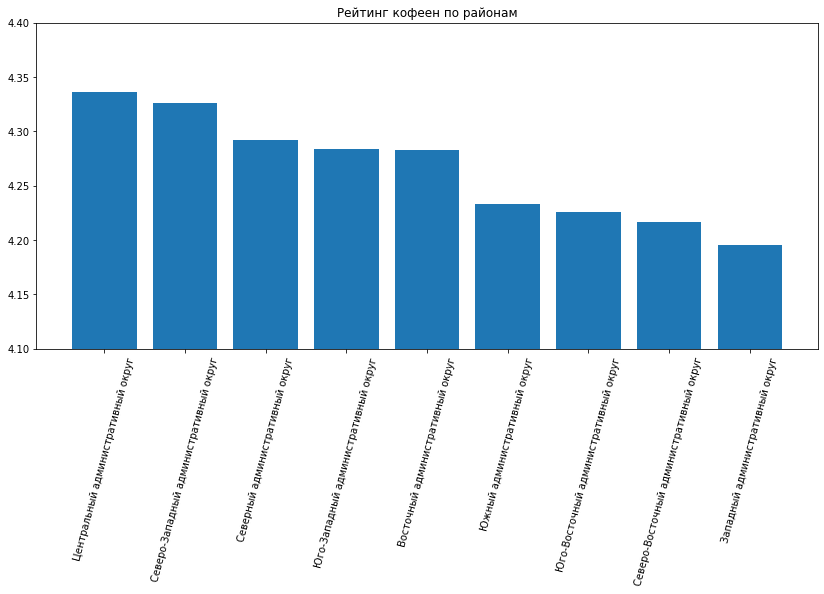

In [67]:
plt.figure(figsize=(14,6))
plt.bar(x = rating_coffee.district, height = rating_coffee.rating)
plt.ylim([4.1, 4.4])
plt.title('Рейтинг кофеен по районам')
plt.xticks(rotation = 75)
plt.show()

In [68]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_coffee,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Рейтинги у кофеен разные от 4.19 до 4,33. Самые высокие рейтинги в Центральном и Северо-Западном округе.

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [69]:
data_cent = (data_coffee.groupby('district')
                .agg(median=('middle_coffee_cup','median'))
                .sort_values(by='median', ascending=False).
                reset_index())
data_cent

,district,median
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


In [70]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_cent,
    columns=['district', 'median'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Стоимость чашки кофе будет завесить от выбранного для кофейни округа, так к примеру, самая дорогая средняя стоимость чаши в Юго-Западном административном округе она составляет 198 руб. на втором месте ЦАО там средняя стоимость 190 руб. Самая дешёвая стоимость чашки кофе в восточном административном округе (135 руб.).

### Сколько сетей в категории кофейни?

In [71]:
group_nam_coffee = (data_coffee.query('chain == 1').groupby('name')
              .agg(count=('name','count'))
                    .sort_values(by='count', ascending=False).reset_index()
             )
print ('Всего сетевых магазинов в категории кофейни:', group_nam_coffee['name'].count())

Всего сетевых магазинов в категории кофейни: 159


In [72]:
group_nam_coffee = group_nam_coffee.head(15)
fig=px.bar(group_nam_coffee, x='name', y='count', title='Топ-15 сетевых кофеен в Москве')
fig.update_xaxes(tickangle=45)
fig.update_xaxes(title_text='Сеть')
fig.update_yaxes(title_text='Кол-во заведений')
fig.show() 

**Вывод:** Самые крупная сеть общественного питания  расположились в категории кофейни.  Всего же в категории кофеен, 159 сетей. Самая крупная, это сеть Шоколадница.

### Рекомендации
В ходе исследования мы выяснили, что кофейня - это одно из самых перспективных вариантов среди заведений общественного питания (16% находился на 3-м месте после кофе и ресторанов). Среднее количество посадочных мест - 111. Наибольшее количество существующих заведений сосредоточено в ЦАО.

С учетом специфики будущего заведения - основной целевой аудиторией видятся работники ближайших офисов и прогуливающиеся люди по улочкам Москвы. В таком месте получаются отличные селфи с кофе, которые не стыдно показать друзьям и коллегам по работе.

В качестве локации рекомендуем обратить внимание на улицах ЦАО, где ни будь в деловом центре. Центр - это всегда улицы с высокой проходимостью и большое количество разных людей и туристов. Конечно в центре и конкуренция выше, но с учетом высокого трафик людей будет необходимое количество посетителей. И вероятность, что поток клиентов иссякнет – маловероятен. В части масштабирования с учетом спецификации будущего заведения, оптимальным вариантом будет создать сет из нескольких точек в 3-4 округах города. Т.к. постоянный клиент с картой лояльность от вашей сети будет искать именно ваше заведение. 


## Презентация

Презентация: https://disk.yandex.ru/i/VOlGvQ8xU4fjYg
